# Images and text

In the past few years, models have emerged that mix text and images. These models are capable of describing and image with text, to generate images with text etc. The general principle is that during training encoding of text and images are "aligned" so that they are encoded in similar ways. This ensures a "fluidity" between the world of text and images and for example doesn't require a fixed vocabulary describing objects as various descriptions of similar images can be understood thanks to the share training of text and images.

Here we take one [example](https://huggingface.co/CIDAS/clipseg-rd64-refined) again from HuggingFace. This models can be used in various modes mixing text and images. Below we show how one can pass an image and a set of descriptions to the model which will then try to find the described objects in the image. Note that here we double the challenge: we use a kid's drawing and use vague descriptions such as grass or princess. Despite this, the model manages to approximately identify all these elements in the drawing.

In [79]:
from transformers import AutoProcessor, CLIPSegForImageSegmentation
from PIL import Image
import requests

processor = AutoProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

#url = "http://images.cocodataset.org/val2017/000000039769.jpg"
#image = Image.open(requests.get(url, stream=True).raw)
image = Image.open('../data/IMG_0975.jpg')
#texts = ["a cat", "a remote", "a blanket"]
texts = ["grass", "two hats", "a princess"]
inputs = processor(text=texts, images=[image] * len(texts), padding=True, return_tensors="pt")

outputs = model(**inputs)

logits = outputs.logits
print(logits.shape)

torch.Size([3, 352, 352])


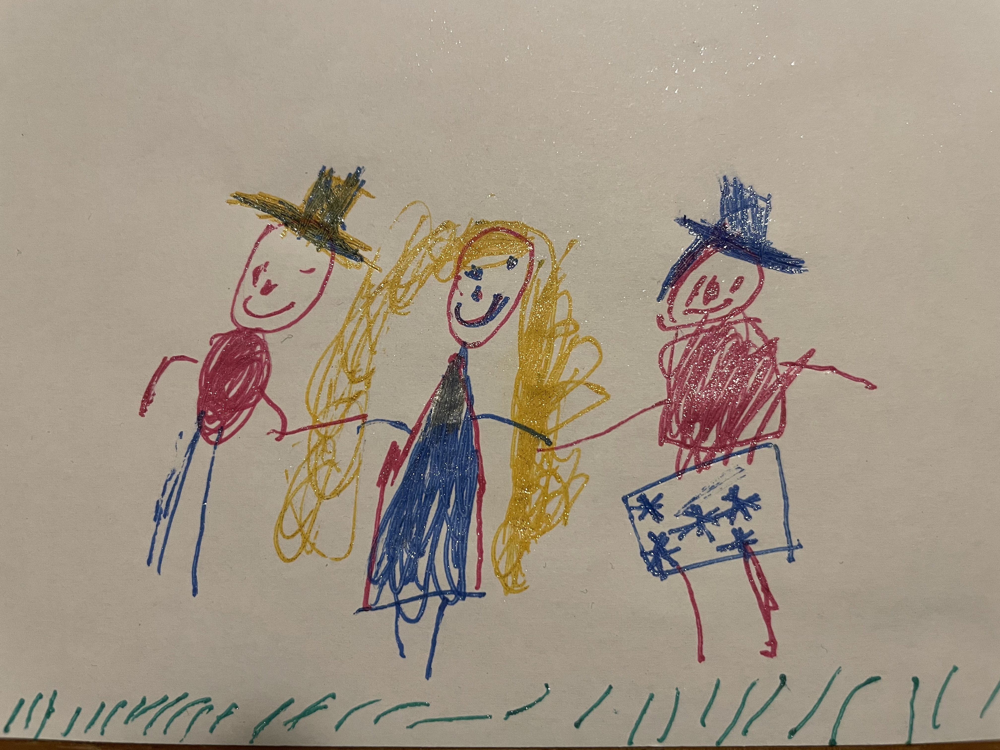

In [78]:
image

In [80]:
logits.shape

torch.Size([3, 352, 352])

In [81]:
import matplotlib.pyplot as plt
import numpy as np

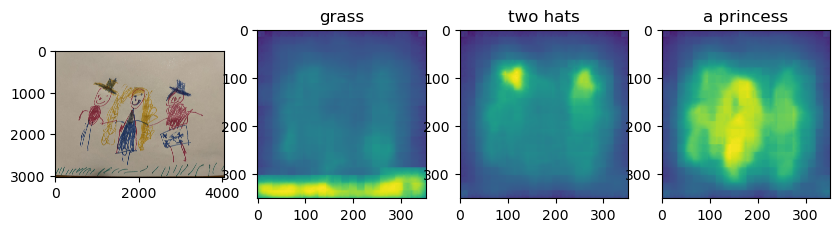

In [86]:
fig, ax = plt.subplots(1, logits.shape[0]+1, figsize=(10,3))
ax[0].imshow(image)
for ind, im in enumerate(logits):
    ax[ind+1].imshow(im.detach().numpy())
    ax[ind+1].set_title(texts[ind])